In [3]:
import os
os.chdir('..')

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from get_protein_data import download_pdb_from_id, extract_3dcoords_from_pdb
from tda_encoding import encode_proteins, encode_proteins_singleprocess
from constants import enzyme_types

In [5]:
# Download pdbs of given enzyme type
download_pdb_from_id(enz='translocases3')

In [6]:
# Store proteins 3d coordinates in json file
extract_3dcoords_from_pdb(enz='translocases3')

/Users/lrigolli/opt/anaconda3/envs/tda_env/lib/python3.11/site-packages/mdtraj/formats/pdb/pdbfile.py:200: UserWarning: Unlikely unit cell vectors detected in PDB file likely resulting from a dummy CRYST1 record. Discarding unit cell vectors.
  warnings.warn('Unlikely unit cell vectors detected in PDB file likely '
/Users/lrigolli/opt/anaconda3/envs/tda_env/lib/python3.11/site-packages/mdtraj/formats/pdb/pdbfile.py:200: UserWarning: Unlikely unit cell vectors detected in PDB file likely resulting from a dummy CRYST1 record. Discarding unit cell vectors.
  warnings.warn('Unlikely unit cell vectors detected in PDB file likely '


1AW0.pdb
1BMF.pdb
1CFF.pdb


In [4]:
# Start with PDB-IDS of single enzymed types stored in separate txt files called enzyme_type.txt (we get those quering pdb, see lucky query in pdb_queries.py file)

In [8]:
#pdb_data_root_path = "/Users/lrigolli/Documents/PDB_data/"
#['hydrolases', 'isomerases', 'ligases', 'lyases', 'oxidoreductases', 'transferases', 'translocases']

In [9]:
enzyme_dirs

['Oxidoreductases',
 'Transferases',
 'Hydrolases',
 'Lyases',
 'Isomerases',
 'Ligases',
 'Translocases']

### Read PDB files and store protein 3d-coordinates as json

In [3]:
# TODO: this takes some time, parallelization may help
#for enz in enzyme_dirs:
#    store_protein3d(pdb_data_root_path + enz)

Read json data with protein coordinates which was created starting from pdb files downloaded from https://www.rcsb.org/ 

### Read protein data: 3d-coordinates + enzyme type

#### Get enzyme type and filter to mono-types

In [31]:
# Read all protein pdb ids from json files
filenames_json = [f'/Users/lrigolli/Documents/PDB_data/{enz}/protein_coords_{enz}.json' for enz in enzyme_dirs]
pdb_ids_all = []
for file in filenames_json:
    pdb_ids_enz = list(read_protein3d(file).keys())
    pdb_ids_all += pdb_ids_enz

<AxesSubplot: >

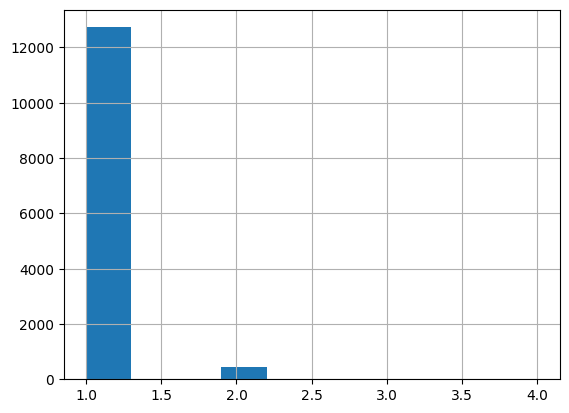

In [32]:
# Check how many enzymes have multiple types
df_pdb_freq = pd.DataFrame(pdb_ids_all,columns=['pdb_id']).value_counts()
df_pdb_freq.hist()

In [33]:
enzyme_multitype = df_pdb_freq[df_pdb_freq >1].reset_index()['pdb_id'].tolist()

In [34]:
# Restrict to monotype enzymes
protein_coords_by_type = {}
for enz in enzyme_dirs:
    protein_coords = read_protein3d(f'/Users/lrigolli/Documents/PDB_data/{enz}/protein_coords_{enz}.json')
    for key in list(protein_coords.keys()):
        if key in enzyme_multitype:
            del protein_coords[key]
    protein_coords_by_type[enz] = protein_coords

In [35]:
# Create df with pdb-id and enzyme type
df_protein_type = pd.DataFrame()
for enz in protein_coords_by_type.keys(): 
    df_enz = pd.DataFrame(data =[enz] * len(protein_coords_by_type[enz]) ,columns = ['enzyme_type'],index=list(protein_coords_by_type[enz].keys()))
    df_protein_type = df_protein_type.append(df_enz)

/var/folders/j3/hpwzgx5x30160r2xw6b2c_2r4f2vlx/T/ipykernel_6794/2089738650.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_protein_type = df_protein_type.append(df_enz)
/var/folders/j3/hpwzgx5x30160r2xw6b2c_2r4f2vlx/T/ipykernel_6794/2089738650.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_protein_type = df_protein_type.append(df_enz)
/var/folders/j3/hpwzgx5x30160r2xw6b2c_2r4f2vlx/T/ipykernel_6794/2089738650.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_protein_type = df_protein_type.append(df_enz)
/var/folders/j3/hpwzgx5x30160r2xw6b2c_2r4f2vlx/T/ipykernel_6794/2089738650.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

In [36]:
# Check enzyme type distribution
df_protein_type.value_counts(['enzyme_type'])

enzyme_type    
hydrolases         7047
transferases       2983
oxidoreductases    1327
isomerases          817
lyases              373
ligases             156
translocases         28
dtype: int64

#### Read protein 3d-coordinates

In [37]:
# Create single dictionary with pdb-id as keys and vector of 3d-coordinates as values
protein_coords_dict = {}
for enz in protein_coords_by_type.keys():
    protein_coords_dict.update(protein_coords_by_type[enz])

In [38]:
# Sort keys alphabetically
protein_coords_dict = dict(sorted(protein_coords_dict.items()))

In [42]:
# Remove duplicates (very few PDBs 1:1000 have exactly same coordinates)
# temp = {str(val) : key for key, val in protein_coords_dict.items()}
# protein_coords_dict = {val : key for key, val in temp.items()}
# duplicate_pdbs = [key for key in list(protein_coords_dict.keys()) if key not in list(res.keys())]
# protein_coords_dict = res

# Example of proteins with different coordinates but same Fourier encoding 
# np.mean(protein_coords_dict['4EEP'][:,0])
# np.mean(protein_coords_dict['4EER'][:,0])

### Encode proteins using TDA
- Get protein persistence homology
- Represent persistence homology in dim 0 as death-time of first 5 bars
- Represent persistence homology in dim 1 and 2 as first 3 landscapes
- Approximate landscapes in dim 1 and 2 with Fourier series - Fourier coefficients are used to vectorize the landscapes


In [13]:
# Define parameters for TDA encoding 
landscapes_params_default = {'num_x_intervals_land':1000, 'num_landscapes_dim1':3, 'num_landscapes_dim2':3, 'land0_vars':5, 'num_fourier_coeffs_dim1':5, 'num_fourier_coeffs_dim2':5}

#### Example: encode a sample of proteins 

In [14]:
np.random.seed(171)
num_samples = 3
pdb_ids_sample = np.random.choice(list(protein_coords_dict.keys()), num_samples, False).tolist()

Num vertices: 3562
Num simplices: 102775
Simplex tree dimension: 3
Getting persistence homology for protein: 5LB6


/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Num vertices: 1418
Num simplices: 39891
Simplex tree dimension: 3
Getting persistence homology for protein: 6FK1


/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Num vertices: 2007
Num simplices: 57019
Simplex tree dimension: 3
Getting persistence homology for protein: 5HUA


/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplot

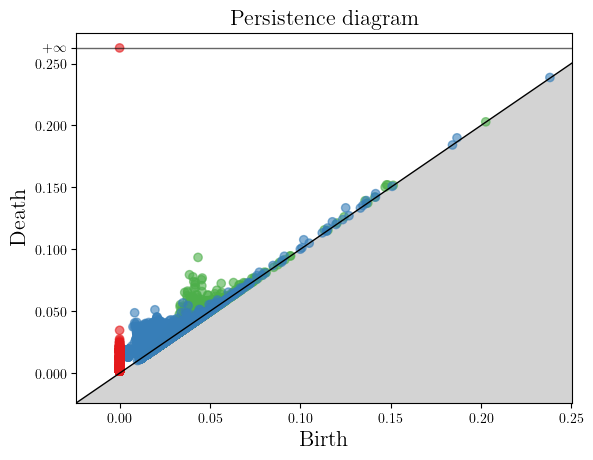

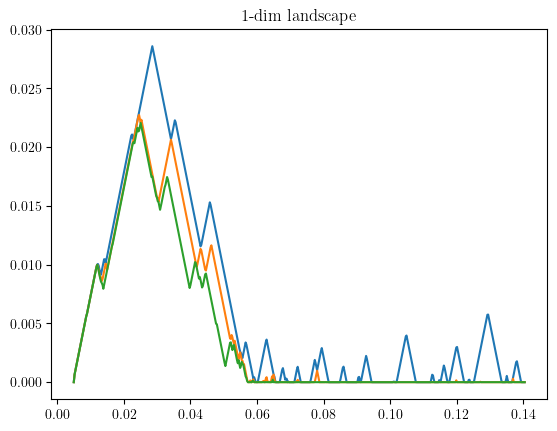

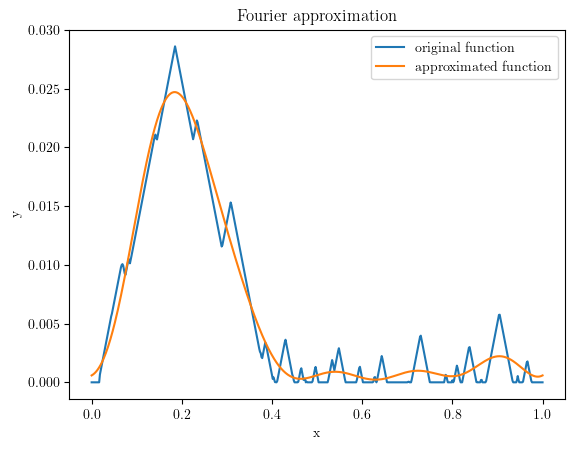

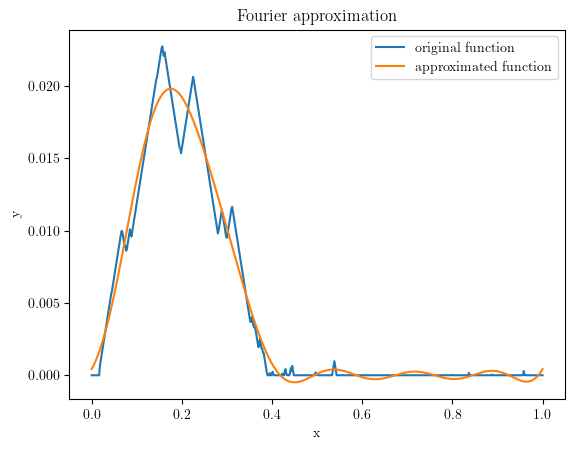

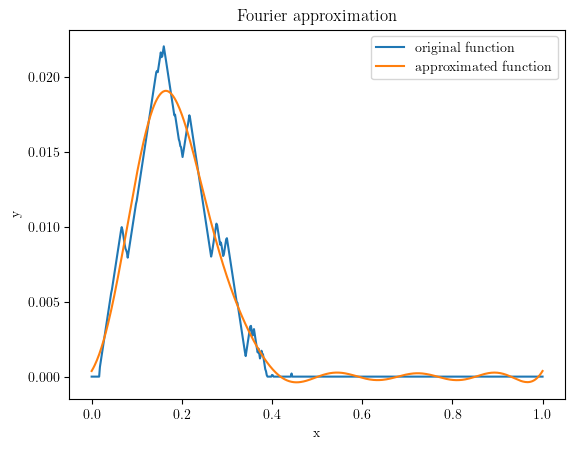

...

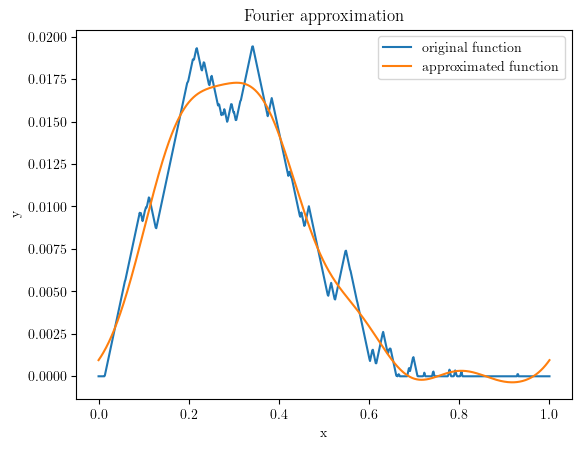

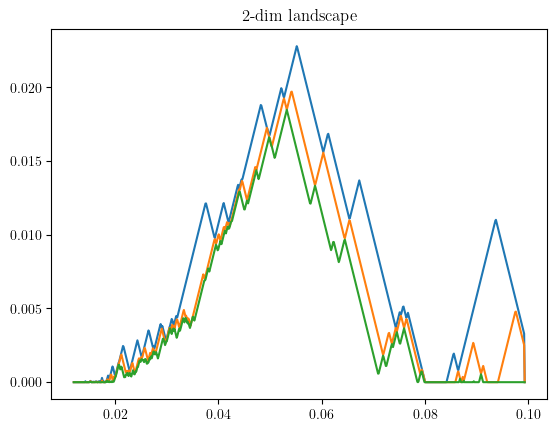

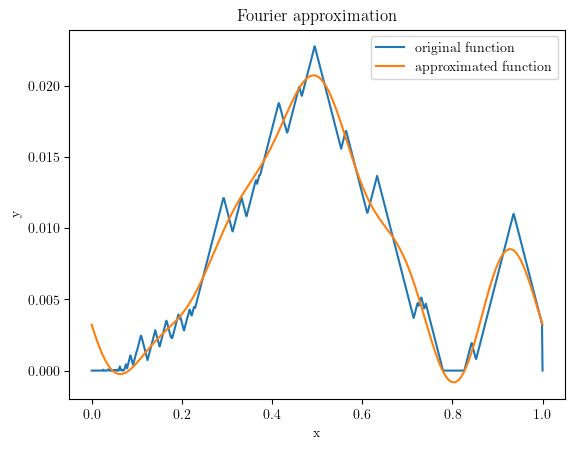

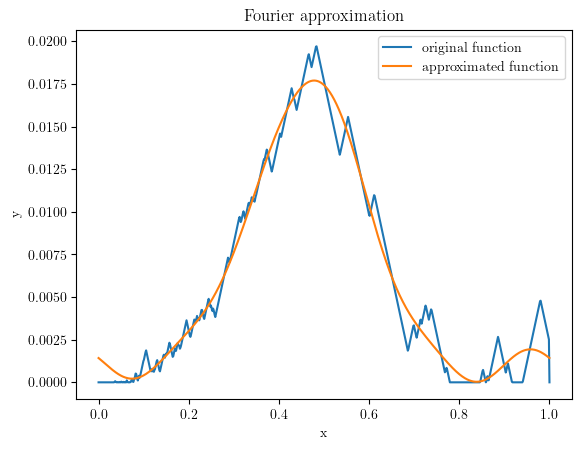

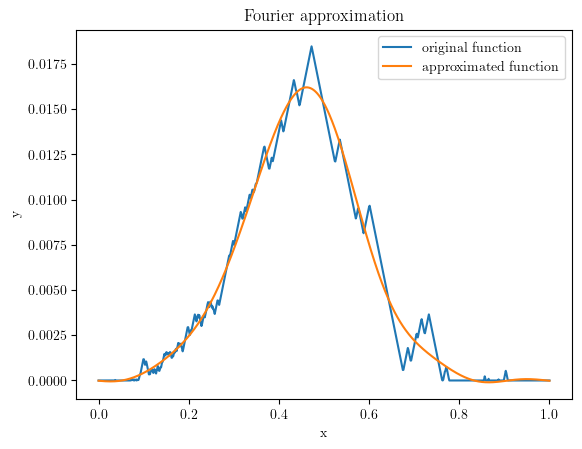

In [15]:
df_prot = encode_proteins_singleprocess(pdb_ids=pdb_ids_sample, protein_coords_dict=protein_coords_dict, landscapes_params=landscapes_params_default)

In [ ]:
stop

### Encode all proteins

In [12]:
pdb_ids = list(protein_coords_dict.keys())

In [17]:
df_prot = encode_proteins(pdb_ids=pdb_ids, protein_coords_dict=protein_coords_dict, landscapes_params=landscapes_params_default)

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcPara

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcPara

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcPara

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num vertices: 1439
Num simplices: 40517
Simplex tree dimension: 3
Getting persistence homology for protein: 102L
Num vertices: 1404
Num simplices: 39585
Simplex tree dimension: 3
Getting persistence homology for protein: 103L
Num vertices: 1451
Num simplices: 40913
Simplex tree dimension: 3
Getting persistence homology for protein: 107L
Num vertices: 1474
Num simplices: 41491
Simplex tree dimension: 3
Getting persistence homology for protein: 108L
Num vertices: 1457
Num simplices: 40997
Simplex tree dimension: 3
Getting persistence homology for protein: 109L
Num vertices: 1441
Num simplices: 40497
Simplex tree dimension: 3
Getting persistence homology for protein: 110L
Num vertices: 1457
Num simplices: 40889
Simplex tree dimension: 3
Getting persistence homology for protein: 111L
Num vertices: 1451
Num simplices: 40711
Simplex tree dimension: 3
Getting persistence homology for protein: 112L
Num vertices: 1456
Num simplices: 40753
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num vertices: 1939
Num simplices: 54867
Simplex tree dimension: 3
Getting persistence homology for protein: 1FMA
Num vertices: 2058
Num simplices: 59843
Simplex tree dimension: 3
Getting persistence homology for protein: 1FMF
Num vertices: 1842
Num simplices: 51885
Simplex tree dimension: 3
Getting persistence homology for protein: 1FMG
Num vertices: 1073
Num simplices: 29797
Simplex tree dimension: 3
Getting persistence homology for protein: 1FN5
Num vertices: 1814
Num simplices: 51155
Simplex tree dimension: 3
Getting persistence homology for protein: 1FN6
Num vertices: 1822
Num simplices: 51607
Simplex tree dimension: 3
Getting persistence homology for protein: 1FNI
Num vertices: 936
Num simplices: 25553
Simplex tree dimension: 3
Getting persistence homology for protein: 1FNJ
Num vertices: 949
Num simplices: 26127
Simplex tree dimension: 3
Getting persistence homology for protein: 1FNK
Num vertices: 1318
Num simplices: 37513
Simplex tree dimension: 3
Getting persistence homology for

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num vertices: 1578
Num simplices: 44525
Simplex tree dimension: 3
Getting persistence homology for protein: 1LSP
Num vertices: 1006
Num simplices: 28081
Simplex tree dimension: 3
Getting persistence homology for protein: 1LSV
Num vertices: 1011
Num simplices: 28137
Simplex tree dimension: 3
Getting persistence homology for protein: 1LSW
Num vertices: 1006
Num simplices: 28055
Simplex tree dimension: 3
Getting persistence homology for protein: 1LSX
Num vertices: 1138
Num simplices: 31561
Simplex tree dimension: 3
Getting persistence homology for protein: 1LSY
Num vertices: 1182
Num simplices: 32985
Simplex tree dimension: 3
Getting persistence homology for protein: 1LSZ
Num vertices: 1002
Num simplices: 27939
Simplex tree dimension: 3
Getting persistence homology for protein: 1LT0
Num vertices: 2671
Num simplices: 77567
Simplex tree dimension: 3
Getting persistence homology for protein: 1LUD
Num vertices: 1764
Num simplices: 51509
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Num vertices: 1989
Num simplices: 56223
Simplex tree dimension: 3
Getting persistence homology for protein: 1SUE
Num vertices: 1739
Num simplices: 48687
Simplex tree dimension: 3
Getting persistence homology for protein: 1SUR
Num vertices: 1189
Num simplices: 33171
Simplex tree dimension: 3
Getting persistence homology for protein: 1SV3
Num vertices: 1016
Num simplices: 28095
Simplex tree dimension: 3
Getting persistence homology for protein: 1SV9
Num vertices: 1619
Num simplices: 45599
Simplex tree dimension: 3
Getting persistence homology for protein: 1SWY
Num vertices: 1616
Num simplices: 45433
Simplex tree dimension: 3
Getting persistence homology for protein: 1SWZ
Num vertices: 1623
Num simplices: 45783
Simplex tree dimension: 3
Getting persistence homology for protein: 1SX2
Num vertices: 1648
Num simplices: 46525
Simplex tree dimension: 3
Getting persistence homology for protein: 1SX7
Num vertices: 1197
Num simplices: 33477
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

Num vertices: 1431
Num simplices: 40257
Simplex tree dimension: 3
Getting persistence homology for protein: 239L
Num vertices: 1447
Num simplices: 40769
Simplex tree dimension: 3
Getting persistence homology for protein: 240L
Num vertices: 1449
Num simplices: 40757
Simplex tree dimension: 3
Getting persistence homology for protein: 241L
Num vertices: 1487
Num simplices: 41665
Simplex tree dimension: 3
Getting persistence homology for protein: 242L
Num vertices: 1441
Num simplices: 40415
Simplex tree dimension: 3
Getting persistence homology for protein: 243L
Num vertices: 1433
Num simplices: 40375
Simplex tree dimension: 3
Getting persistence homology for protein: 244L
Num vertices: 1461
Num simplices: 41119
Simplex tree dimension: 3
Getting persistence homology for protein: 245L
Num vertices: 1463
Num simplices: 41013
Simplex tree dimension: 3
Getting persistence homology for protein: 246L
Num vertices: 1455
Num simplices: 40901
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:98: RuntimeWarnin

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

Num vertices: 1742
Num simplices: 48477
Simplex tree dimension: 3
Getting persistence homology for protein: 2I4X
Num vertices: 1927
Num simplices: 55811
Simplex tree dimension: 3
Getting persistence homology for protein: 2I50
Num vertices: 1742
Num simplices: 49381
Simplex tree dimension: 3
Getting persistence homology for protein: 2I5D
Num vertices: 525
Num simplices: 14619
Simplex tree dimension: 3
Getting persistence homology for protein: 2I5O
Num vertices: 1022
Num simplices: 28563
Simplex tree dimension: 3
Getting persistence homology for protein: 2I5S
Num vertices: 1445
Num simplices: 40571
Simplex tree dimension: 3
Getting persistence homology for protein: 2I6J
Num vertices: 1344
Num simplices: 37697
Simplex tree dimension: 3
Getting persistence homology for protein: 2I6M
Num vertices: 1486
Num simplices: 41759
Simplex tree dimension: 3
Getting persistence homology for protein: 2I6O
Num vertices: 1329
Num simplices: 36981
Simplex tree dimension: 3
Getting persistence homology fo

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num vertices: 1923
Num simplices: 54453
Simplex tree dimension: 3
Getting persistence homology for protein: 2PW6
Num vertices: 1099
Num simplices: 30569
Simplex tree dimension: 3
Getting persistence homology for protein: 2PW7
Num vertices: 1292
Num simplices: 36265
Simplex tree dimension: 3
Getting persistence homology for protein: 2PWQ
Num vertices: 1053
Num simplices: 29323
Simplex tree dimension: 3
Getting persistence homology for protein: 2PWS
Num vertices: 1819
Num simplices: 51385
Simplex tree dimension: 3
Getting persistence homology for protein: 2PXX
Num vertices: 1250
Num simplices: 34607
Simplex tree dimension: 3
Getting persistence homology for protein: 2PY4
Num vertices: 1249
Num simplices: 34961
Simplex tree dimension: 3
Getting persistence homology for protein: 2PYC
Num vertices: 1077
Num simplices: 29811
Simplex tree dimension: 3
Getting persistence homology for protein: 2PYK
Num vertices: 1733
Num simplices: 48887
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num vertices: 1595
Num simplices: 44767
Simplex tree dimension: 3
Getting persistence homology for protein: 3DCN
Num vertices: 1687
Num simplices: 47193
Simplex tree dimension: 3
Getting persistence homology for protein: 3DCR
Num vertices: 1920
Num simplices: 53999
Simplex tree dimension: 3
Getting persistence homology for protein: 3DCT
Num vertices: 1887
Num simplices: 53123
Simplex tree dimension: 3
Getting persistence homology for protein: 3DCU
Num vertices: 1457
Num simplices: 40851
Simplex tree dimension: 3
Getting persistence homology for protein: 3DCZ
Num vertices: 1639
Num simplices: 45985
Simplex tree dimension: 3
Getting persistence homology for protein: 3DFR
Num vertices: 1135
Num simplices: 31749
Simplex tree dimension: 3
Getting persistence homology for protein: 3DHQ
Num vertices: 1618
Num simplices: 45513
Simplex tree dimension: 3
Getting persistence homology for protein: 3DKE
Num vertices: 1964
Num simplices: 55489
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

 1AKZ
Num vertices: 334
Num simplices: 9079
Simplex tree dimension: 3
Getting persistence homology for protein: 1ALG
Num vertices: 1420
Num simplices: 39793
Simplex tree dimension: 3
Getting persistence homology for protein: 1AM2
Num vertices: 1837
Num simplices: 51651
Simplex tree dimension: 3
Getting persistence homology for protein: 1ANB
Num vertices: 1846
Num simplices: 51869
Simplex tree dimension: 3
Getting persistence homology for protein: 1ANC
Num vertices: 1812
Num simplices: 50865
Simplex tree dimension: 3
Getting persistence homology for protein: 1AND
Num vertices: 1798
Num simplices: 50531
Simplex tree dimension: 3
Getting persistence homology for protein: 1ANE
Num vertices: 993
Num simplices: 27417
Simplex tree dimension: 3
Getting persistence homology for protein: 1ANG
Num vertices: 2611
Num simplices: 75611
Simplex tree dimension: 3
Getting persistence homology for protein: 1AO8
Num vertices: 1919
Num simplices: 55967
Simplex tree dimension: 3
Getting persistence homolog

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 1GHJ
Num vertices: 1181
Num simplices: 33539
Simplex tree dimension: 3
Getting persistence homology for protein: 1GHK
Num vertices: 4112
Num simplices: 120109
Simplex tree dimension: 3
Getting persistence homology for protein: 1GHZ
Num vertices: 4060
Num simplices: 119293
Simplex tree dimension: 3
Getting persistence homology for protein: 1GI0
Num vertices: 4027
Num simplices: 117861
Simplex tree dimension: 3
Getting persistence homology for protein: 1GI1
Num vertices: 4065
Num simplices: 119017
Simplex tree dimension: 3
Getting persistence homology for protein: 1GI2
Num vertices: 4048
Num simplices: 118339
Simplex tree dimension: 3
Getting persistence homology for protein: 1GI3
Num vertices: 4082
Num simplices: 119309
Simplex tree dimension: 3
Getting persistence homology for protein: 1GI4
Num vertices: 4119
Num simplices: 120585
Simplex tree dimension: 3
Getting persistence homology for protein: 1GI5
Num vertices: 4094
Num simplices: 119673
S

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num vertices: 1509
Num simplices: 42559
Simplex tree dimension: 3
Getting persistence homology for protein: 3Q6Z
Num vertices: 1692
Num simplices: 47601
Simplex tree dimension: 3
Getting persistence homology for protein: 3Q71
Num vertices: 1856
Num simplices: 52393
Simplex tree dimension: 3
Getting persistence homology for protein: 3Q77
Num vertices: 1832
Num simplices: 51881
Simplex tree dimension: 3
Getting persistence homology for protein: 3Q7B
Num vertices: 1947
Num simplices: 55303
Simplex tree dimension: 3
Getting persistence homology for protein: 3Q7C
Num vertices: 1893
Num simplices: 53377
Simplex tree dimension: 3
Getting persistence homology for protein: 3QAV
Num vertices: 1933
Num simplices: 54437
Simplex tree dimension: 3
Getting persistence homology for protein: 3QAW
Num vertices: 1138
Num simplices: 31917
Simplex tree dimension: 3
Getting persistence homology for protein: 3QB3
Num vertices: 1064
Num simplices: 29643
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num vertices: 1699
Num simplices: 47789
Simplex tree dimension: 3
Getting persistence homology for protein: 4EVV
Num vertices: 1678
Num simplices: 46945
Simplex tree dimension: 3
Getting persistence homology for protein: 4EW0
Num vertices: 1631
Num simplices: 45973
Simplex tree dimension: 3
Getting persistence homology for protein: 4EW4
Num vertices: 1961
Num simplices: 55155
Simplex tree dimension: 3
Getting persistence homology for protein: 4EWN
Num vertices: 1338
Num simplices: 37725
Simplex tree dimension: 3
Getting persistence homology for protein: 4F0V
Num vertices: 1381
Num simplices: 38941
Simplex tree dimension: 3
Getting persistence homology for protein: 4F0W
Num vertices: 909
Num simplices: 25157
Simplex tree dimension: 3
Getting persistence homology for protein: 4F2F
Num vertices: 588
Num simplices: 16157
Simplex tree dimension: 3
Getting persistence homology for protein: 4F2L
Num vertices: 949
Num simplices: 26231
Simplex tree dimension: 3
Getting persistence homology for 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

1MXI
Num vertices: 1669
Num simplices: 46533
Simplex tree dimension: 3
Getting persistence homology for protein: 1MXS
Num vertices: 1967
Num simplices: 55389
Simplex tree dimension: 3
Getting persistence homology for protein: 1MZA
Num vertices: 1859
Num simplices: 52187
Simplex tree dimension: 3
Getting persistence homology for protein: 1MZD
Num vertices: 1854
Num simplices: 53379
Simplex tree dimension: 3
Getting persistence homology for protein: 1MZK
Num vertices: 1911
Num simplices: 53861
Simplex tree dimension: 3
Getting persistence homology for protein: 1MZV
Num vertices: 1825
Num simplices: 51173
Simplex tree dimension: 3
Getting persistence homology for protein: 1MZW
Num vertices: 1278
Num simplices: 35491
Simplex tree dimension: 3
Getting persistence homology for protein: 1N05
Num vertices: 1919
Num simplices: 53999
Simplex tree dimension: 3
Getting persistence homology for protein: 1N1A
Num vertices: 990
Num simplices: 27435
Simplex tree dimension: 3
Getting persistence homolo

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa


Num vertices: 1429
Num simplices: 39913
Simplex tree dimension: 3
Getting persistence homology for protein: 1U14
Num vertices: 899
Num simplices: 24639
Simplex tree dimension: 3
Getting persistence homology for protein: 1U2H
Num vertices: 1569
Num simplices: 44837
Simplex tree dimension: 3
Getting persistence homology for protein: 1U2N
Num vertices: 1363
Num simplices: 37863
Simplex tree dimension: 3
Getting persistence homology for protein: 1U2P
Num vertices: 1289
Num simplices: 35661
Simplex tree dimension: 3
Getting persistence homology for protein: 1U2Q
Num vertices: 1509
Num simplices: 42121
Simplex tree dimension: 3
Getting persistence homology for protein: 1U3G
Num vertices: 1844
Num simplices: 52051
Simplex tree dimension: 3
Getting persistence homology for protein: 1U3I
Num vertices: 1184
Num simplices: 32917
Simplex tree dimension: 3
Getting persistence homology for protein: 1U3L
Num vertices: 996
Num simplices: 28229
Simplex tree dimension: 3
Getting persistence homology fo

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

Num vertices: 948
Num simplices: 26255
Simplex tree dimension: 3
Getting persistence homology for protein: 4QSY
Num vertices: 1128
Num simplices: 31471
Simplex tree dimension: 3
Getting persistence homology for protein: 4QT2
Num vertices: 1211
Num simplices: 33753
Simplex tree dimension: 3
Getting persistence homology for protein: 4QT3
Num vertices: 1416
Num simplices: 39853
Simplex tree dimension: 3
Getting persistence homology for protein: 4QT6
Num vertices: 1142
Num simplices: 32375
Simplex tree dimension: 3
Getting persistence homology for protein: 4QT7
Num vertices: 1426
Num simplices: 39837
Simplex tree dimension: 3
Getting persistence homology for protein: 4QUT
Num vertices: 1393
Num simplices: 38947
Simplex tree dimension: 3
Getting persistence homology for protein: 4QUU
Num vertices: 1846
Num simplices: 52505
Simplex tree dimension: 3
Getting persistence homology for protein: 4QUW
Num vertices: 1140
Num simplices: 31793
Simplex tree dimension: 3
Getting persistence homology fo

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 2BAA
Num vertices: 1206
Num simplices: 33585
Simplex tree dimension: 3
Getting persistence homology for protein: 2BAX
Num vertices: 1959
Num simplices: 55461
Simplex tree dimension: 3
Getting persistence homology for protein: 2BB4
Num vertices: 1791
Num simplices: 50511
Simplex tree dimension: 3
Getting persistence homology for protein: 2BBA
Num vertices: 1223
Num simplices: 34147
Simplex tree dimension: 3
Getting persistence homology for protein: 2BCH
Num vertices: 1951
Num simplices: 55087
Simplex tree dimension: 3
Getting persistence homology for protein: 2BD2
Num vertices: 1975
Num simplices: 55789
Simplex tree dimension: 3
Getting persistence homology for protein: 2BD3
Num vertices: 1921
Num simplices: 54313
Simplex tree dimension: 3
Getting persistence homology for protein: 2BD4
Num vertices: 1949
Num simplices: 54969
Simplex tree dimension: 3
Getting persistence homology for protein: 2BD5
Num vertices: 1951
Num simplices: 55111
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num vertices: 1661
Num simplices: 47023
Simplex tree dimension: 3
Getting persistence homology for protein: 5HT4
Num vertices: 1647
Num simplices: 46653
Simplex tree dimension: 3
Getting persistence homology for protein: 5HT5
Num vertices: 1133
Num simplices: 31327
Simplex tree dimension: 3
Getting persistence homology for protein: 5HU4
Num vertices: 2007
Num simplices: 57019
Simplex tree dimension: 3
Getting persistence homology for protein: 5HUA
Num vertices: 743
Num simplices: 20353
Simplex tree dimension: 3
Getting persistence homology for protein: 5HUB
Num vertices: 1677
Num simplices: 47289
Simplex tree dimension: 3
Getting persistence homology for protein: 5HUI
Num vertices: 1145
Num simplices: 32125
Simplex tree dimension: 3
Getting persistence homology for protein: 5HUR
Num vertices: 1624
Num simplices: 45809
Simplex tree dimension: 3
Getting persistence homology for protein: 5HVB
Num vertices: 1695
Num simplices: 47781
Simplex tree dimension: 3
Getting persistence homology fo

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

2166
Num simplices: 62911
Simplex tree dimension: 3
Getting persistence homology for protein: 2JVJ
Num vertices: 2166
Num simplices: 62895
Simplex tree dimension: 3
Getting persistence homology for protein: 2JVK
Num vertices: 2063
Num simplices: 59619
Simplex tree dimension: 3
Getting persistence homology for protein: 2JVN
Num vertices: 1426
Num simplices: 40315
Simplex tree dimension: 3
Getting persistence homology for protein: 2JWA
Num vertices: 780
Num simplices: 22011
Simplex tree dimension: 3
Getting persistence homology for protein: 2JX8
Num vertices: 1487
Num simplices: 42647
Simplex tree dimension: 3
Getting persistence homology for protein: 2JXG
Num vertices: 1792
Num simplices: 50653
Simplex tree dimension: 3
Getting persistence homology for protein: 2JXI
Num vertices: 1571
Num simplices: 45145
Simplex tree dimension: 3
Getting persistence homology for protein: 2JXJ
Num vertices: 3243
Num simplices: 93751
Simplex tree dimension: 3
Getting persistence homology for protein: 2JX

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Num vertices: 1453
Num simplices: 40819
Simplex tree dimension: 3
Getting persistence homology for protein: 5WA6
Num vertices: 1455
Num simplices: 41039
Simplex tree dimension: 3
Getting persistence homology for protein: 5WA7
Num vertices: 1457
Num simplices: 40905
Simplex tree dimension: 3
Getting persistence homology for protein: 5WAP
Num vertices: 1478
Num simplices: 41335
Simplex tree dimension: 3
Getting persistence homology for protein: 5WB3
Num vertices: 1005
Num simplices: 28065
Simplex tree dimension: 3
Getting persistence homology for protein: 5WBN
Num vertices: 1722
Num simplices: 48235
Simplex tree dimension: 3
Getting persistence homology for protein: 5WCJ
Num vertices: 1495
Num simplices: 42029
Simplex tree dimension: 3
Getting persistence homology for protein: 5WCS
Num vertices: 1445
Num simplices: 40387
Simplex tree dimension: 3
Getting persistence homology for protein: 5WCT
Num vertices: 1468
Num simplices: 41177
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 2RON
Num vertices: 1979
Num simplices: 57059
Simplex tree dimension: 3
Getting persistence homology for protein: 2ROV
Num vertices: 1376
Num simplices: 39419
Simplex tree dimension: 3
Getting persistence homology for protein: 2ROW
Num vertices: 1710
Num simplices: 49203
Simplex tree dimension: 3
Getting persistence homology for protein: 2RPI
Num vertices: 1095
Num simplices: 31331
Simplex tree dimension: 3
Getting persistence homology for protein: 2RPN
Num vertices: 3039
Num simplices: 88711
Simplex tree dimension: 3
Getting persistence homology for protein: 2RPZ
Num vertices: 2591
Num simplices: 74491
Simplex tree dimension: 3
Getting persistence homology for protein: 2RQ0
Num vertices: 2087
Num simplices: 59621
Simplex tree dimension: 3
Getting persistence homology for protein: 2RQ6
Num vertices: 1522
Num simplices: 43333
Simplex tree dimension: 3
Getting persistence homology for protein: 2RQ8
Num vertices: 2171
Num simplices: 63003
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num vertices: 1606
Num simplices: 45295
Simplex tree dimension: 3
Getting persistence homology for protein: 3FAN
Num vertices: 1512
Num simplices: 42143
Simplex tree dimension: 3
Getting persistence homology for protein: 3FAO
Num vertices: 1986
Num simplices: 56521
Simplex tree dimension: 3
Getting persistence homology for protein: 3FB4
Num vertices: 1267
Num simplices: 35427
Simplex tree dimension: 3
Getting persistence homology for protein: 3FBA
Num vertices: 1481
Num simplices: 41861
Simplex tree dimension: 3
Getting persistence homology for protein: 3FC7
Num vertices: 1167
Num simplices: 32509
Simplex tree dimension: 3
Getting persistence homology for protein: 3FE0
Num vertices: 937
Num simplices: 26137
Simplex tree dimension: 3
Getting persistence homology for protein: 3FFY
Num vertices: 1073
Num simplices: 29789
Simplex tree dimension: 3
Getting persistence homology for protein: 3FG5
Num vertices: 1261
Num simplices: 35385
Simplex tree dimension: 3
Getting persistence homology fo

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Num vertices: 1422
Num simplices: 40127
Simplex tree dimension: 3
Getting persistence homology for protein: 6JOG
Num vertices: 1585
Num simplices: 45215
Simplex tree dimension: 3
Getting persistence homology for protein: 6JPD
Num vertices: 1733
Num simplices: 49243
Simplex tree dimension: 3
Getting persistence homology for protein: 6JQT
Num vertices: 3060
Num simplices: 88009
Simplex tree dimension: 3
Getting persistence homology for protein: 6JUG
Num vertices: 1816
Num simplices: 51079
Simplex tree dimension: 3
Getting persistence homology for protein: 6JV6
Num vertices: 3193
Num simplices: 92161
Simplex tree dimension: 3
Getting persistence homology for protein: 6JWB
Num vertices: 1745
Num simplices: 49273
Simplex tree dimension: 3
Getting persistence homology for protein: 6JWM
Num vertices: 3104
Num simplices: 89349
Simplex tree dimension: 3
Getting persistence homology for protein: 6JXL
Num vertices: 2047
Num simplices: 58651
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num simplices: 77291
Simplex tree dimension: 3
Getting persistence homology for protein: 1BTX
Num vertices: 3891
Num simplices: 114005
Simplex tree dimension: 3
Getting persistence homology for protein: 1BTY
Num vertices: 2637
Num simplices: 77011
Simplex tree dimension: 3
Getting persistence homology for protein: 1BTZ
Num vertices: 1692
Num simplices: 47913
Simplex tree dimension: 3
Getting persistence homology for protein: 1BUD
Num vertices: 1709
Num simplices: 49341
Simplex tree dimension: 3
Getting persistence homology for protein: 1BUJ
Num vertices: 1523
Num simplices: 42793
Simplex tree dimension: 3
Getting persistence homology for protein: 1BUN
Num vertices: 3858
Num simplices: 112453
Simplex tree dimension: 3
Getting persistence homology for protein: 1BUQ
Num vertices: 2493
Num simplices: 72779
Simplex tree dimension: 3
Getting persistence homology for protein: 1BVH
Num vertices: 1842
Num simplices: 53499
Simplex tree dimension: 3
Getting persistence homology for protein: 1BVM


/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

Num vertices: 1058
Num simplices: 29525
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDT
Num vertices: 1058
Num simplices: 29411
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDU
Num vertices: 1887
Num simplices: 53335
Simplex tree dimension: 3
Getting persistence homology for protein: 7CEI
Num vertices: 1806
Num simplices: 51061
Simplex tree dimension: 3
Getting persistence homology for protein: 7CFE
Num vertices: 2217
Num simplices: 64389
Simplex tree dimension: 3
Getting persistence homology for protein: 7CFV
Num vertices: 1192
Num simplices: 33141
Simplex tree dimension: 3
Getting persistence homology for protein: 7CFW
Num vertices: 1761
Num simplices: 49495
Simplex tree dimension: 3
Getting persistence homology for protein: 7CHI
Num vertices: 1588
Num simplices: 44317
Simplex tree dimension: 3
Getting persistence homology for protein: 7CHX
Num vertices: 1826
Num simplices: 51365
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Simplex tree dimension: 3
Getting persistence homology for protein: 1HZM
Num vertices: 1388
Num simplices: 38721
Simplex tree dimension: 3
Getting persistence homology for protein: 1HZT
Num vertices: 3030
Num simplices: 88295
Simplex tree dimension: 3
Getting persistence homology for protein: 1I18
Num vertices: 1720
Num simplices: 48263
Simplex tree dimension: 3
Getting persistence homology for protein: 1I1H
Num vertices: 1148
Num simplices: 32003
Simplex tree dimension: 3
Getting persistence homology for protein: 1I1Z
Num vertices: 1114
Num simplices: 30937
Simplex tree dimension: 3
Getting persistence homology for protein: 1I20
Num vertices: 1557
Num simplices: 44583
Simplex tree dimension: 3
Getting persistence homology for protein: 1I35
Num vertices: 1726
Num simplices: 48011
Simplex tree dimension: 3
Getting persistence homology for protein: 1I39
Num vertices: 1707
Num simplices: 47641
Simplex tree dimension: 3
Getting persistence homology for protein: 1I3A
Num vertices: 1810
Num 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 3S4M
Num vertices: 1730
Num simplices: 48505
Simplex tree dimension: 3
Getting persistence homology for protein: 3S53
Num vertices: 1726
Num simplices: 48299
Simplex tree dimension: 3
Getting persistence homology for protein: 3S54
Num vertices: 1712
Num simplices: 47835
Simplex tree dimension: 3
Getting persistence homology for protein: 3S56
Num vertices: 1051
Num simplices: 29335
Simplex tree dimension: 3
Getting persistence homology for protein: 3S5D
Num vertices: 1117
Num simplices: 31249
Simplex tree dimension: 3
Getting persistence homology for protein: 3S5E
Num vertices: 1885
Num simplices: 52963
Simplex tree dimension: 3
Getting persistence homology for protein: 3S5P
Num vertices: 3652
Num simplices: 105717
Simplex tree dimension: 3
Getting persistence homology for protein: 3S68
Num vertices: 1676
Num simplices: 47207
Simplex tree dimension: 3
Getting persistence homology for protein: 3S6A
Num vertices: 1418
Num simplices: 39895
Simplex 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

1112
Num simplices: 31145
Simplex tree dimension: 3
Getting persistence homology for protein: 4H9E
Num vertices: 1107
Num simplices: 31003
Simplex tree dimension: 3
Getting persistence homology for protein: 4H9F
Num vertices: 1117
Num simplices: 31251
Simplex tree dimension: 3
Getting persistence homology for protein: 4H9H
Num vertices: 1115
Num simplices: 31031
Simplex tree dimension: 3
Getting persistence homology for protein: 4H9I
Num vertices: 1956
Num simplices: 55419
Simplex tree dimension: 3
Getting persistence homology for protein: 4HBG
Num vertices: 1067
Num simplices: 29693
Simplex tree dimension: 3
Getting persistence homology for protein: 4HC6
Num vertices: 967
Num simplices: 27627
Simplex tree dimension: 3
Getting persistence homology for protein: 4HCK
Num vertices: 1105
Num simplices: 31147
Simplex tree dimension: 3
Getting persistence homology for protein: 4HDD
Num vertices: 1550
Num simplices: 43781
Simplex tree dimension: 3
Getting persistence homology for protein: 4HG

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 1V2P
Num vertices: 1727
Num simplices: 48077
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2Q
Num vertices: 1752
Num simplices: 48887
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2R
Num vertices: 1768
Num simplices: 49235
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2S
Num vertices: 1728
Num simplices: 48275
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2T
Num vertices: 1754
Num simplices: 48985
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2U
Num vertices: 1690
Num simplices: 47073
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2V
Num vertices: 1752
Num simplices: 48925
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2W
Num vertices: 1757
Num simplices: 49459
Simplex tree dimension: 3
Getting persistence homology for protein: 1V2X
Num vertices: 1189
Num simplices: 33241
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Simplex tree dimension: 3
Getting persistence homology for protein: 1O4D
Num vertices: 989
Num simplices: 27267
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4E
Num vertices: 954
Num simplices: 26491
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4F
Num vertices: 1022
Num simplices: 28335
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4G
Num vertices: 1040
Num simplices: 28817
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4H
Num vertices: 1043
Num simplices: 28957
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4I
Num vertices: 1017
Num simplices: 28329
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4J
Num vertices: 1025
Num simplices: 28399
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4K
Num vertices: 1013
Num simplices: 28249
Simplex tree dimension: 3
Getting persistence homology for protein: 1O4L
Num vertices: 1021
Num si

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 2COA
Num vertices: 1809
Num simplices: 52197
Simplex tree dimension: 3
Getting persistence homology for protein: 2COE
Num vertices: 1722
Num simplices: 49307
Simplex tree dimension: 3
Getting persistence homology for protein: 2COK
Num vertices: 1928
Num simplices: 55665
Simplex tree dimension: 3
Getting persistence homology for protein: 2COM
Num vertices: 1041
Num simplices: 29553
Simplex tree dimension: 3
Getting persistence homology for protein: 2COO
Num vertices: 757
Num simplices: 21123
Simplex tree dimension: 3
Getting persistence homology for protein: 2COS
Num vertices: 1377
Num simplices: 38549
Simplex tree dimension: 3
Getting persistence homology for protein: 2CPL
Num vertices: 1967
Num simplices: 56639
Simplex tree dimension: 3
Getting persistence homology for protein: 2CPR
Num vertices: 1759
Num simplices: 50473
Simplex tree dimension: 3
Getting persistence homology for protein: 2CPT
Num vertices: 912
Num simplices: 25751
Simplex tre

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

Num vertices: 1385
Num simplices: 39091
Simplex tree dimension: 3
Getting persistence homology for protein: 4UMD
Num vertices: 1428
Num simplices: 39947
Simplex tree dimension: 3
Getting persistence homology for protein: 4UME
Num vertices: 1842
Num simplices: 51671
Simplex tree dimension: 3
Getting persistence homology for protein: 4UMN
Num vertices: 1409
Num simplices: 39455
Simplex tree dimension: 3
Getting persistence homology for protein: 4UNP
Num vertices: 1397
Num simplices: 38989
Simplex tree dimension: 3
Getting persistence homology for protein: 4UPU
Num vertices: 893
Num simplices: 24747
Simplex tree dimension: 3
Getting persistence homology for protein: 4URD
Num vertices: 1801
Num simplices: 51169
Simplex tree dimension: 3
Getting persistence homology for protein: 4UUH
Num vertices: 1682
Num simplices: 47543
Simplex tree dimension: 3
Getting persistence homology for protein: 4UUZ
Num vertices: 3435
Num simplices: 99165
Simplex tree dimension: 3
Getting persistence homology fo

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 5JF5
Num vertices: 1841
Num simplices: 51805
Simplex tree dimension: 3
Getting persistence homology for protein: 5JF7
Num vertices: 1858
Num simplices: 52025
Simplex tree dimension: 3
Getting persistence homology for protein: 5JF8
Num vertices: 1422
Num simplices: 39835
Simplex tree dimension: 3
Getting persistence homology for protein: 5JG0
Num vertices: 1513
Num simplices: 42657
Simplex tree dimension: 3
Getting persistence homology for protein: 5JGE
Num vertices: 1660
Num simplices: 46979
Simplex tree dimension: 3
Getting persistence homology for protein: 5JGN
Num vertices: 1933
Num simplices: 54123
Simplex tree dimension: 3
Getting persistence homology for protein: 5JGP
Num vertices: 1630
Num simplices: 45941
Simplex tree dimension: 3
Getting persistence homology for protein: 5JGR
Num vertices: 1630
Num simplices: 45787
Simplex tree dimension: 3
Getting persistence homology for protein: 5JGU
Num vertices: 1572
Num simplices: 44239
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

 914
Num simplices: 25135
Simplex tree dimension: 3
Getting persistence homology for protein: 5YKW
Num vertices: 1051
Num simplices: 29365
Simplex tree dimension: 3
Getting persistence homology for protein: 5YKY
Num vertices: 1539
Num simplices: 43939
Simplex tree dimension: 3
Getting persistence homology for protein: 5YP8
Num vertices: 1509
Num simplices: 43081
Simplex tree dimension: 3
Getting persistence homology for protein: 5YPA
Num vertices: 2719
Num simplices: 78509
Simplex tree dimension: 3
Getting persistence homology for protein: 5YPB
Num vertices: 2951
Num simplices: 85189
Simplex tree dimension: 3
Getting persistence homology for protein: 5YPC
Num vertices: 2678
Num simplices: 77175
Simplex tree dimension: 3
Getting persistence homology for protein: 5YPE
Num vertices: 2739
Num simplices: 79455
Simplex tree dimension: 3
Getting persistence homology for protein: 5YPF
Num vertices: 1491
Num simplices: 42569
Simplex tree dimension: 3
Getting persistence homology for protein: 5Y

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Num simplices: 45609
Simplex tree dimension: 3
Getting persistence homology for protein: 2KRE
Num vertices: 2299
Num simplices: 66509
Simplex tree dimension: 3
Getting persistence homology for protein: 2KRJ
Num vertices: 1032
Num simplices: 29223
Simplex tree dimension: 3
Getting persistence homology for protein: 2KRU
Num vertices: 1414
Num simplices: 40049
Simplex tree dimension: 3
Getting persistence homology for protein: 2KS1
Num vertices: 3156
Num simplices: 92015
Simplex tree dimension: 3
Getting persistence homology for protein: 2KS6
Num vertices: 1239
Num simplices: 35305
Simplex tree dimension: 3
Getting persistence homology for protein: 2KSD
Num vertices: 1300
Num simplices: 36801
Simplex tree dimension: 3
Getting persistence homology for protein: 2KSE
Num vertices: 1660
Num simplices: 47543
Simplex tree dimension: 3
Getting persistence homology for protein: 2KSF
Num vertices: 696
Num simplices: 19293
Simplex tree dimension: 3
Getting persistence homology for protein: 2KSG
Num

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 2W4P
Num vertices: 1508
Num simplices: 42135
Simplex tree dimension: 3
Getting persistence homology for protein: 2W5Y
Num vertices: 1589
Num simplices: 44349
Simplex tree dimension: 3
Getting persistence homology for protein: 2W5Z
Num vertices: 1728
Num simplices: 48551
Simplex tree dimension: 3
Getting persistence homology for protein: 2W6R
Num vertices: 1577
Num simplices: 43999
Simplex tree dimension: 3
Getting persistence homology for protein: 2W7R
Num vertices: 1428
Num simplices: 40151
Simplex tree dimension: 3
Getting persistence homology for protein: 2W9G
Num vertices: 1390
Num simplices: 38963
Simplex tree dimension: 3
Getting persistence homology for protein: 2W9H
Num vertices: 924
Num simplices: 25611
Simplex tree dimension: 3
Getting persistence homology for protein: 2W9R
Num vertices: 1182
Num simplices: 32943
Simplex tree dimension: 3
Getting persistence homology for protein: 2WAR
Num vertices: 1259
Num simplices: 34473
Simplex tr

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 3HNR
Num vertices: 1076
Num simplices: 29855
Simplex tree dimension: 3
Getting persistence homology for protein: 3HOG
Num vertices: 1973
Num simplices: 55845
Simplex tree dimension: 3
Getting persistence homology for protein: 3HP1
Num vertices: 1148
Num simplices: 32091
Simplex tree dimension: 3
Getting persistence homology for protein: 3HQC
Num vertices: 1850
Num simplices: 52201
Simplex tree dimension: 3
Getting persistence homology for protein: 3HQF
Num vertices: 934
Num simplices: 25861
Simplex tree dimension: 3
Getting persistence homology for protein: 3HQJ
Num vertices: 1906
Num simplices: 53799
Simplex tree dimension: 3
Getting persistence homology for protein: 3HQU
Num vertices: 931
Num simplices: 25855
Simplex tree dimension: 3
Getting persistence homology for protein: 3HQX
Num vertices: 1526
Num simplices: 42791
Simplex tree dimension: 3
Getting persistence homology for protein: 3HSG
Num vertices: 1540
Num simplices: 43273
Simplex tre

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

Getting persistence homology for protein: 6MG9
Num vertices: 586
Num simplices: 15765
Simplex tree dimension: 3
Getting persistence homology for protein: 6MIW
Num vertices: 1274
Num simplices: 35385
Simplex tree dimension: 3
Getting persistence homology for protein: 6MJK
Num vertices: 2891
Num simplices: 83345
Simplex tree dimension: 3
Getting persistence homology for protein: 6MQG
Num vertices: 1059
Num simplices: 29649
Simplex tree dimension: 3
Getting persistence homology for protein: 6MQV
Num vertices: 3020
Num simplices: 86945
Simplex tree dimension: 3
Getting persistence homology for protein: 6MR1
Num vertices: 2762
Num simplices: 79225
Simplex tree dimension: 3
Getting persistence homology for protein: 6MR9
Num vertices: 1943
Num simplices: 55265
Simplex tree dimension: 3
Getting persistence homology for protein: 6MRN
Num vertices: 2813
Num simplices: 80627
Simplex tree dimension: 3
Getting persistence homology for protein: 6MT8
Num vertices: 2866
Num simplices: 82137
Simplex tr

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 3TSI
Num vertices: 1485
Num simplices: 42013
Simplex tree dimension: 3
Getting persistence homology for protein: 3TSK
Num vertices: 870
Num simplices: 23977
Simplex tree dimension: 3
Getting persistence homology for protein: 3TSL
Num vertices: 1466
Num simplices: 41689
Simplex tree dimension: 3
Getting persistence homology for protein: 3TT4
Num vertices: 930
Num simplices: 25633
Simplex tree dimension: 3
Getting persistence homology for protein: 3TTA
Num vertices: 1510
Num simplices: 42965
Simplex tree dimension: 3
Getting persistence homology for protein: 3TVC
Num vertices: 1631
Num simplices: 45869
Simplex tree dimension: 3
Getting persistence homology for protein: 3TVK
Num vertices: 1421
Num simplices: 39519
Simplex tree dimension: 3
Getting persistence homology for protein: 3TVQ
Num vertices: 1476
Num simplices: 41531
Simplex tree dimension: 3
Getting persistence homology for protein: 3TWH
Num vertices: 1425
Num simplices: 39937
Simplex tre

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

2644
Num simplices: 76285
Simplex tree dimension: 3
Getting persistence homology for protein: 1J4P
Num vertices: 2619
Num simplices: 75505
Simplex tree dimension: 3
Getting persistence homology for protein: 1J4Q
Num vertices: 1546
Num simplices: 43733
Simplex tree dimension: 3
Getting persistence homology for protein: 1J4X
Num vertices: 1641
Num simplices: 45927
Simplex tree dimension: 3
Getting persistence homology for protein: 1J53
Num vertices: 1620
Num simplices: 45283
Simplex tree dimension: 3
Getting persistence homology for protein: 1J54
Num vertices: 1964
Num simplices: 54567
Simplex tree dimension: 3
Getting persistence homology for protein: 1J5P
Num vertices: 1867
Num simplices: 52371
Simplex tree dimension: 3
Getting persistence homology for protein: 1J5T
Num vertices: 1209
Num simplices: 33283
Simplex tree dimension: 3
Getting persistence homology for protein: 1J6V
Num vertices: 1855
Num simplices: 53643
Simplex tree dimension: 3
Getting persistence homology for protein: 1J

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 1COO
Num vertices: 299
Num simplices: 7699
Simplex tree dimension: 3
Getting persistence homology for protein: 1CPB
Num vertices: 1819
Num simplices: 51243
Simplex tree dimension: 3
Getting persistence homology for protein: 1CPM
Num vertices: 1773
Num simplices: 50043
Simplex tree dimension: 3
Getting persistence homology for protein: 1CPN
Num vertices: 1817
Num simplices: 52465
Simplex tree dimension: 3
Getting persistence homology for protein: 1CQG
Num vertices: 1817
Num simplices: 52393
Simplex tree dimension: 3
Getting persistence homology for protein: 1CQH
Num vertices: 907
Num simplices: 25035
Simplex tree dimension: 3
Getting persistence homology for protein: 1CQY
Num vertices: 2672
Num simplices: 77259
Simplex tree dimension: 3
Getting persistence homology for protein: 1CRP
Num vertices: 2672
Num simplices: 77459
Simplex tree dimension: 3
Getting persistence homology for protein: 1CRQ
Num vertices: 2672
Num simplices: 77847
Simplex tree

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Num vertices: 2482
Num simplices: 72149
Simplex tree dimension: 3
Getting persistence homology for protein: 7HSC
Num vertices: 1472
Num simplices: 41863
Simplex tree dimension: 3
Getting persistence homology for protein: 7JGK
Num vertices: 1467
Num simplices: 41567
Simplex tree dimension: 3
Getting persistence homology for protein: 7JGO
Num vertices: 1421
Num simplices: 40111
Simplex tree dimension: 3
Getting persistence homology for protein: 7JGP
Num vertices: 1474
Num simplices: 41705
Simplex tree dimension: 3
Getting persistence homology for protein: 7JGQ
Num vertices: 1025
Num simplices: 28427
Simplex tree dimension: 3
Getting persistence homology for protein: 7JI4
Num vertices: 1509
Num simplices: 42307
Simplex tree dimension: 3
Getting persistence homology for protein: 7JIF
Num vertices: 1372
Num simplices: 38175
Simplex tree dimension: 3
Getting persistence homology for protein: 7JIG
Num vertices: 2423
Num simplices: 69669
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num vertices: 1645
Num simplices: 45975
Simplex tree dimension: 3
Getting persistence homology for protein: 4J9I
Num vertices: 1862
Num simplices: 52585
Simplex tree dimension: 3
Getting persistence homology for protein: 4J9J
Num vertices: 1934
Num simplices: 54481
Simplex tree dimension: 3
Getting persistence homology for protein: 4JAU
Num vertices: 1587
Num simplices: 44679
Simplex tree dimension: 3
Getting persistence homology for protein: 4JC4
Num vertices: 1852
Num simplices: 52515
Simplex tree dimension: 3
Getting persistence homology for protein: 4JCN
Num vertices: 1497
Num simplices: 41847
Simplex tree dimension: 3
Getting persistence homology for protein: 4JCP
Num vertices: 1616
Num simplices: 45469
Simplex tree dimension: 3
Getting persistence homology for protein: 4JE4
Num vertices: 1718
Num simplices: 48109
Simplex tree dimension: 3
Getting persistence homology for protein: 4JEG
Num vertices: 1949
Num simplices: 54881
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 1WH0
Num vertices: 1877
Num simplices: 53837
Simplex tree dimension: 3
Getting persistence homology for protein: 1WH1
Num vertices: 1951
Num simplices: 56377
Simplex tree dimension: 3
Getting persistence homology for protein: 1WH4
Num vertices: 1399
Num simplices: 40023
Simplex tree dimension: 3
Getting persistence homology for protein: 1WH9
Num vertices: 2440
Num simplices: 70487
Simplex tree dimension: 3
Getting persistence homology for protein: 1WHB
Num vertices: 1292
Num simplices: 36843
Simplex tree dimension: 3
Getting persistence homology for protein: 1WHE
Num vertices: 1292
Num simplices: 37273
Simplex tree dimension: 3
Getting persistence homology for protein: 1WHF
Num vertices: 1395
Num simplices: 40049
Simplex tree dimension: 3
Getting persistence homology for protein: 1WHL
Num vertices: 1317
Num simplices: 37615
Simplex tree dimension: 3
Getting persistence homology for protein: 1WHM
Num vertices: 1997
Num simplices: 57169
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

 1609
Num simplices: 45525
Simplex tree dimension: 3
Getting persistence homology for protein: 1PD9
Num vertices: 1519
Num simplices: 43211
Simplex tree dimension: 3
Getting persistence homology for protein: 1PDB
Num vertices: 1662
Num simplices: 46419
Simplex tree dimension: 3
Getting persistence homology for protein: 1PDL
Num vertices: 1058
Num simplices: 29375
Simplex tree dimension: 3
Getting persistence homology for protein: 1PDO
Num vertices: 1567
Num simplices: 43527
Simplex tree dimension: 3
Getting persistence homology for protein: 1PDV
Num vertices: 1886
Num simplices: 53673
Simplex tree dimension: 3
Getting persistence homology for protein: 1PE6
Num vertices: 604
Num simplices: 16511
Simplex tree dimension: 3
Getting persistence homology for protein: 1PEH
Num vertices: 379
Num simplices: 10141
Simplex tree dimension: 3
Getting persistence homology for protein: 1PEI
Num vertices: 1678
Num simplices: 47359
Simplex tree dimension: 3
Getting persistence homology for protein: 1PE

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 2DOS
Num vertices: 1081
Num simplices: 30091
Simplex tree dimension: 3
Getting persistence homology for protein: 2DPZ
Num vertices: 1648
Num simplices: 47179
Simplex tree dimension: 3
Getting persistence homology for protein: 2DRN
Num vertices: 1943
Num simplices: 55983
Simplex tree dimension: 3
Getting persistence homology for protein: 2DUN
Num vertices: 1496
Num simplices: 41699
Simplex tree dimension: 3
Getting persistence homology for protein: 2DVK
Num vertices: 1602
Num simplices: 44671
Simplex tree dimension: 3
Getting persistence homology for protein: 2DVO
Num vertices: 1587
Num simplices: 44563
Simplex tree dimension: 3
Getting persistence homology for protein: 2DVP
Num vertices: 1872
Num simplices: 52527
Simplex tree dimension: 3
Getting persistence homology for protein: 2DX0
Num vertices: 1477
Num simplices: 41411
Simplex tree dimension: 3
Getting persistence homology for protein: 2DXA
Num vertices: 1398
Num simplices: 39161
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 4XJD
Num vertices: 1057
Num simplices: 29393
Simplex tree dimension: 3
Getting persistence homology for protein: 4XJF
Num vertices: 1100
Num simplices: 30413
Simplex tree dimension: 3
Getting persistence homology for protein: 4XJG
Num vertices: 1060
Num simplices: 29479
Simplex tree dimension: 3
Getting persistence homology for protein: 4XJH
Num vertices: 1105
Num simplices: 30943
Simplex tree dimension: 3
Getting persistence homology for protein: 4XJI
Num vertices: 954
Num simplices: 26489
Simplex tree dimension: 3
Getting persistence homology for protein: 4XJJ
Num vertices: 3371
Num simplices: 97457
Simplex tree dimension: 3
Getting persistence homology for protein: 4XJV
Num vertices: 1584
Num simplices: 44561
Simplex tree dimension: 3
Getting persistence homology for protein: 4XMC
Num vertices: 1703
Num simplices: 48127
Simplex tree dimension: 3
Getting persistence homology for protein: 4XMD
Num vertices: 1662
Num simplices: 46717
Simplex tr

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Simplex tree dimension: 3
Getting persistence homology for protein: 5LA8
Num vertices: 1508
Num simplices: 42551
Simplex tree dimension: 3
Getting persistence homology for protein: 5LAB
Num vertices: 1099
Num simplices: 30675
Simplex tree dimension: 3
Getting persistence homology for protein: 5LAF
Num vertices: 1094
Num simplices: 30617
Simplex tree dimension: 3
Getting persistence homology for protein: 5LAG
Num vertices: 1094
Num simplices: 30617
Simplex tree dimension: 3
Getting persistence homology for protein: 5LAN
Num vertices: 3600
Num simplices: 104075
Simplex tree dimension: 3
Getting persistence homology for protein: 5LAT
Num vertices: 3562
Num simplices: 102775
Simplex tree dimension: 3
Getting persistence homology for protein: 5LB6
Num vertices: 3548
Num simplices: 102871
Simplex tree dimension: 3
Getting persistence homology for protein: 5LBB
Num vertices: 3524
Num simplices: 101735
Simplex tree dimension: 3
Getting persistence homology for protein: 5LBC
Num vertices: 3434


/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

1600
Num simplices: 46017
Simplex tree dimension: 3
Getting persistence homology for protein: 2LNA
Num vertices: 2635
Num simplices: 76695
Simplex tree dimension: 3
Getting persistence homology for protein: 2LO6
Num vertices: 2132
Num simplices: 61541
Simplex tree dimension: 3
Getting persistence homology for protein: 2LOX
Num vertices: 2469
Num simplices: 71823
Simplex tree dimension: 3
Getting persistence homology for protein: 2LOZ
Num vertices: 917
Num simplices: 26217
Simplex tree dimension: 3
Getting persistence homology for protein: 2LP5
Num vertices: 2360
Num simplices: 68365
Simplex tree dimension: 3
Getting persistence homology for protein: 2LPE
Num vertices: 1598
Num simplices: 44721
Simplex tree dimension: 3
Getting persistence homology for protein: 2LPR
Num vertices: 2447
Num simplices: 71061
Simplex tree dimension: 3
Getting persistence homology for protein: 2LPU
Num vertices: 1617
Num simplices: 46589
Simplex tree dimension: 3
Getting persistence homology for protein: 2LP

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:


Num simplices: 89215
Simplex tree dimension: 3
Getting persistence homology for protein: 6AJO
Num vertices: 3338
Num simplices: 96103
Simplex tree dimension: 3
Getting persistence homology for protein: 6AJP
Num vertices: 1802
Num simplices: 50467
Simplex tree dimension: 3
Getting persistence homology for protein: 6AJQ
Num vertices: 1837
Num simplices: 52063
Simplex tree dimension: 3
Getting persistence homology for protein: 6AJR
Num vertices: 1762
Num simplices: 49585
Simplex tree dimension: 3
Getting persistence homology for protein: 6AJS
Num vertices: 1546
Num simplices: 43199
Simplex tree dimension: 3
Getting persistence homology for protein: 6AKQ
Num vertices: 1533
Num simplices: 43205
Simplex tree dimension: 3
Getting persistence homology for protein: 6AL9
Num vertices: 1853
Num simplices: 52125
Simplex tree dimension: 3
Getting persistence homology for protein: 6ALB
Num vertices: 1138
Num simplices: 31951
Simplex tree dimension: 3
Getting persistence homology for protein: 6AMF
N

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 2YBM
Num vertices: 1036
Num simplices: 28713
Simplex tree dimension: 3
Getting persistence homology for protein: 2YBN
Num vertices: 1912
Num simplices: 53881
Simplex tree dimension: 3
Getting persistence homology for protein: 2YC3
Num vertices: 1897
Num simplices: 53523
Simplex tree dimension: 3
Getting persistence homology for protein: 2YC5
Num vertices: 1759
Num simplices: 49633
Simplex tree dimension: 3
Getting persistence homology for protein: 2YCM
Num vertices: 1619
Num simplices: 45147
Simplex tree dimension: 3
Getting persistence homology for protein: 2YD1
Num vertices: 1561
Num simplices: 43579
Simplex tree dimension: 3
Getting persistence homology for protein: 2YD2
Num vertices: 1630
Num simplices: 45599
Simplex tree dimension: 3
Getting persistence homology for protein: 2YD3
Num vertices: 1876
Num simplices: 52923
Simplex tree dimension: 3
Getting persistence homology for protein: 2YD4
Num vertices: 1569
Num simplices: 43673
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 3K45
Num vertices: 1700
Num simplices: 48361
Simplex tree dimension: 3
Getting persistence homology for protein: 3K47
Num vertices: 1999
Num simplices: 56551
Simplex tree dimension: 3
Getting persistence homology for protein: 3K6Y
Num vertices: 1535
Num simplices: 43163
Simplex tree dimension: 3
Getting persistence homology for protein: 3K7G
Num vertices: 1448
Num simplices: 40677
Simplex tree dimension: 3
Getting persistence homology for protein: 3K7H
Num vertices: 1580
Num simplices: 44679
Simplex tree dimension: 3
Getting persistence homology for protein: 3K7I
Num vertices: 1313
Num simplices: 36877
Simplex tree dimension: 3
Getting persistence homology for protein: 3K7J
Num vertices: 1547
Num simplices: 43325
Simplex tree dimension: 3
Getting persistence homology for protein: 3K8Y
Num vertices: 1830
Num simplices: 51393
Simplex tree dimension: 3
Getting persistence homology for protein: 3K97
Num vertices: 1382
Num simplices: 38737
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 6QLL
Num vertices: 1230
Num simplices: 34327
Simplex tree dimension: 3
Getting persistence homology for protein: 6QMF
Num vertices: 1261
Num simplices: 35199
Simplex tree dimension: 3
Getting persistence homology for protein: 6QMG
Num vertices: 1298
Num simplices: 36339
Simplex tree dimension: 3
Getting persistence homology for protein: 6QMH
Num vertices: 1209
Num simplices: 33735
Simplex tree dimension: 3
Getting persistence homology for protein: 6QMI
Num vertices: 1126
Num simplices: 31413
Simplex tree dimension: 3
Getting persistence homology for protein: 6QNB
Num vertices: 1133
Num simplices: 31603
Simplex tree dimension: 3
Getting persistence homology for protein: 6QPJ
Num vertices: 1095
Num simplices: 30497
Simplex tree dimension: 3
Getting persistence homology for protein: 6QQ3
Num vertices: 1122
Num simplices: 31391
Simplex tree dimension: 3
Getting persistence homology for protein: 6QQC
Num vertices: 1109
Num simplices: 31115
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 7MX0
Num vertices: 1539
Num simplices: 43321
Simplex tree dimension: 3
Getting persistence homology for protein: 7MY5
Num vertices: 1062
Num simplices: 29525
Simplex tree dimension: 3
Getting persistence homology for protein: 7MYX
Num vertices: 1470
Num simplices: 41201
Simplex tree dimension: 3
Getting persistence homology for protein: 7N03
Num vertices: 4008
Num simplices: 116441
Simplex tree dimension: 3
Getting persistence homology for protein: 7N0E
Num vertices: 2968
Num simplices: 85179
Simplex tree dimension: 3
Getting persistence homology for protein: 7N11
Num vertices: 1761
Num simplices: 50095
Simplex tree dimension: 3
Getting persistence homology for protein: 7N2X
Num vertices: 1546
Num simplices: 43661
Simplex tree dimension: 3
Getting persistence homology for protein: 7N47
Num vertices: 1538
Num simplices: 43337
Simplex tree dimension: 3
Getting persistence homology for protein: 7N55
Num vertices: 1556
Num simplices: 43799
Simplex 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num simplices: 49521
Simplex tree dimension: 3
Getting persistence homology for protein: 1KLK
Num vertices: 2827
Num simplices: 81953
Simplex tree dimension: 3
Getting persistence homology for protein: 1KLT
Num vertices: 1218
Num simplices: 34241
Simplex tree dimension: 3
Getting persistence homology for protein: 1KLX
Num vertices: 1839
Num simplices: 51649
Simplex tree dimension: 3
Getting persistence homology for protein: 1KLY
Num vertices: 1811
Num simplices: 50509
Simplex tree dimension: 3
Getting persistence homology for protein: 1KLZ
Num vertices: 1825
Num simplices: 51317
Simplex tree dimension: 3
Getting persistence homology for protein: 1KM2
Num vertices: 1845
Num simplices: 51717
Simplex tree dimension: 3
Getting persistence homology for protein: 1KM3
Num vertices: 1893
Num simplices: 53259
Simplex tree dimension: 3
Getting persistence homology for protein: 1KM4
Num vertices: 1847
Num simplices: 51801
Simplex tree dimension: 3
Getting persistence homology for protein: 1KM5
Nu

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 3WPJ
Num vertices: 1071
Num simplices: 29885
Simplex tree dimension: 3
Getting persistence homology for protein: 3WPK
Num vertices: 1070
Num simplices: 29933
Simplex tree dimension: 3
Getting persistence homology for protein: 3WPL
Num vertices: 1871
Num simplices: 52835
Simplex tree dimension: 3
Getting persistence homology for protein: 3WQ9
Num vertices: 1071
Num simplices: 29945
Simplex tree dimension: 3
Getting persistence homology for protein: 3WU7
Num vertices: 1072
Num simplices: 29925
Simplex tree dimension: 3
Getting persistence homology for protein: 3WU8
Num vertices: 1072
Num simplices: 29921
Simplex tree dimension: 3
Getting persistence homology for protein: 3WU9
Num vertices: 1070
Num simplices: 29873
Simplex tree dimension: 3
Getting persistence homology for protein: 3WUA
Num vertices: 1115
Num simplices: 31217
Simplex tree dimension: 3
Getting persistence homology for protein: 3WUL
Num vertices: 1130
Num simplices: 31635
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 1DKJ
Num vertices: 871
Num simplices: 24333
Simplex tree dimension: 3
Getting persistence homology for protein: 1DL6
Num vertices: 1242
Num simplices: 34977
Simplex tree dimension: 3
Getting persistence homology for protein: 1DLA
Num vertices: 1646
Num simplices: 46195
Simplex tree dimension: 3
Getting persistence homology for protein: 1DLR
Num vertices: 1698
Num simplices: 47839
Simplex tree dimension: 3
Getting persistence homology for protein: 1DLS
Num vertices: 1004
Num simplices: 27561
Simplex tree dimension: 3
Getting persistence homology for protein: 1DMM
Num vertices: 1003
Num simplices: 27613
Simplex tree dimension: 3
Getting persistence homology for protein: 1DMN
Num vertices: 1003
Num simplices: 27697
Simplex tree dimension: 3
Getting persistence homology for protein: 1DMQ
Num vertices: 2548
Num simplices: 74277
Simplex tree dimension: 3
Getting persistence homology for protein: 1DMZ
Num vertices: 1806
Num simplices: 50617
Simplex tr

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 4LFX
Num vertices: 983
Num simplices: 27385
Simplex tree dimension: 3
Getting persistence homology for protein: 4LG7
Num vertices: 1172
Num simplices: 33021
Simplex tree dimension: 3
Getting persistence homology for protein: 4LGK
Num vertices: 330
Num simplices: 8639
Simplex tree dimension: 3
Getting persistence homology for protein: 4LH9
Num vertices: 1182
Num simplices: 32833
Simplex tree dimension: 3
Getting persistence homology for protein: 4LHR
Num vertices: 1046
Num simplices: 29143
Simplex tree dimension: 3
Getting persistence homology for protein: 4LIF
Num vertices: 945
Num simplices: 26257
Simplex tree dimension: 3
Getting persistence homology for protein: 4LJN
Num vertices: 1229
Num simplices: 34459
Simplex tree dimension: 3
Getting persistence homology for protein: 4LK9
Num vertices: 1217
Num simplices: 34171
Simplex tree dimension: 3
Getting persistence homology for protein: 4LKA
Num vertices: 1933
Num simplices: 54051
Simplex tree 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

948
Num simplices: 27013
Simplex tree dimension: 3
Getting persistence homology for protein: 1QLY
Num vertices: 1129
Num simplices: 31137
Simplex tree dimension: 3
Getting persistence homology for protein: 1QMT
Num vertices: 1882
Num simplices: 54275
Simplex tree dimension: 3
Getting persistence homology for protein: 1QND
Num vertices: 1574
Num simplices: 44083
Simplex tree dimension: 3
Getting persistence homology for protein: 1QNG
Num vertices: 1438
Num simplices: 40025
Simplex tree dimension: 3
Getting persistence homology for protein: 1QNT
Num vertices: 1504
Num simplices: 41971
Simplex tree dimension: 3
Getting persistence homology for protein: 1QOI
Num vertices: 1874
Num simplices: 52475
Simplex tree dimension: 3
Getting persistence homology for protein: 1QPF
Num vertices: 1812
Num simplices: 50745
Simplex tree dimension: 3
Getting persistence homology for protein: 1QPL
Num vertices: 1637
Num simplices: 46099
Simplex tree dimension: 3
Getting persistence homology for protein: 1QQ

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 5ADQ
Num vertices: 1876
Num simplices: 53249
Simplex tree dimension: 3
Getting persistence homology for protein: 5ADR
Num vertices: 1903
Num simplices: 54031
Simplex tree dimension: 3
Getting persistence homology for protein: 5ADS
Num vertices: 1843
Num simplices: 52057
Simplex tree dimension: 3
Getting persistence homology for protein: 5ADT
Num vertices: 1090
Num simplices: 30153
Simplex tree dimension: 3
Getting persistence homology for protein: 5AFE
Num vertices: 1738
Num simplices: 48937
Simplex tree dimension: 3
Getting persistence homology for protein: 5AGR
Num vertices: 1755
Num simplices: 49465
Simplex tree dimension: 3
Getting persistence homology for protein: 5AGS
Num vertices: 1772
Num simplices: 50077
Simplex tree dimension: 3
Getting persistence homology for protein: 5AGT
Num vertices: 1890
Num simplices: 52943
Simplex tree dimension: 3
Getting persistence homology for protein: 5AHE
Num vertices: 1819
Num simplices: 51243
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 1XT5
Num vertices: 1110
Num simplices: 31061
Simplex tree dimension: 3
Getting persistence homology for protein: 1XTE
Num vertices: 2686
Num simplices: 78527
Simplex tree dimension: 3
Getting persistence homology for protein: 1XUF
Num vertices: 3978
Num simplices: 116287
Simplex tree dimension: 3
Getting persistence homology for protein: 1XUG
Num vertices: 2428
Num simplices: 70383
Simplex tree dimension: 3
Getting persistence homology for protein: 1XUH
Num vertices: 2514
Num simplices: 73265
Simplex tree dimension: 3
Getting persistence homology for protein: 1XUI
Num vertices: 2477
Num simplices: 71831
Simplex tree dimension: 3
Getting persistence homology for protein: 1XUJ
Num vertices: 2681
Num simplices: 78081
Simplex tree dimension: 3
Getting persistence homology for protein: 1XUK
Num vertices: 224
Num simplices: 5957
Simplex tree dimension: 3
Getting persistence homology for protein: 1XV4
Num vertices: 224
Num simplices: 5991
Simplex tree

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Getting persistence homology for protein: 2F0V
Num vertices: 1133
Num simplices: 31579
Simplex tree dimension: 3
Getting persistence homology for protein: 2F0W
Num vertices: 1335
Num simplices: 37205
Simplex tree dimension: 3
Getting persistence homology for protein: 2F1W
Num vertices: 1301
Num simplices: 36347
Simplex tree dimension: 3
Getting persistence homology for protein: 2F1Y
Num vertices: 1403
Num simplices: 38911
Simplex tree dimension: 3
Getting persistence homology for protein: 2F21
Num vertices: 1836
Num simplices: 53025
Simplex tree dimension: 3
Getting persistence homology for protein: 2F2D
Num vertices: 1181
Num simplices: 33061
Simplex tree dimension: 3
Getting persistence homology for protein: 2F2N
Num vertices: 1576
Num simplices: 44259
Simplex tree dimension: 3
Getting persistence homology for protein: 2F2Q
Num vertices: 1155
Num simplices: 32345
Simplex tree dimension: 3
Getting persistence homology for protein: 2F30
Num vertices: 1597
Num simplices: 44877
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Num vertices: 1795
Num simplices: 50495
Simplex tree dimension: 3
Getting persistence homology for protein: 5NBA
Num vertices: 1101
Num simplices: 30727
Simplex tree dimension: 3
Getting persistence homology for protein: 5NBJ
Num vertices: 1047
Num simplices: 29081
Simplex tree dimension: 3
Getting persistence homology for protein: 5NE0
Num vertices: 1781
Num simplices: 50199
Simplex tree dimension: 3
Getting persistence homology for protein: 5NEI
Num vertices: 1381
Num simplices: 38777
Simplex tree dimension: 3
Getting persistence homology for protein: 5NGT
Num vertices: 1276
Num simplices: 35717
Simplex tree dimension: 3
Getting persistence homology for protein: 5NGZ
Num vertices: 1825
Num simplices: 51461
Simplex tree dimension: 3
Getting persistence homology for protein: 5NHI
Num vertices: 1151
Num simplices: 32093
Simplex tree dimension: 3
Getting persistence homology for protein: 5NJ1
Num vertices: 1738
Num simplices: 48831
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: 

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Num simplices: 4139
Simplex tree dimension: 3
Getting persistence homology for protein: 2MG0
Num vertices: 921
Num simplices: 25753
Simplex tree dimension: 3
Getting persistence homology for protein: 2MGV
Num vertices: 2011
Num simplices: 58051
Simplex tree dimension: 3
Getting persistence homology for protein: 2MH0
Num vertices: 2024
Num simplices: 58623
Simplex tree dimension: 3
Getting persistence homology for protein: 2MH9
Num vertices: 1386
Num simplices: 39485
Simplex tree dimension: 3
Getting persistence homology for protein: 2MIQ
Num vertices: 1372
Num simplices: 39295
Simplex tree dimension: 3
Getting persistence homology for protein: 2MJ6
Num vertices: 1974
Num simplices: 56775
Simplex tree dimension: 3
Getting persistence homology for protein: 2MJA
Num vertices: 3088
Num simplices: 89883
Simplex tree dimension: 3
Getting persistence homology for protein: 2MJL
Num vertices: 1707
Num simplices: 49127
Simplex tree dimension: 3
Getting persistence homology for protein: 2MK2
Num 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Getting persistence homology for protein: 6TG6
Num vertices: 1224
Num simplices: 34103
Simplex tree dimension: 3
Getting persistence homology for protein: 6TGJ
Num vertices: 942
Num simplices: 25955
Simplex tree dimension: 3
Getting persistence homology for protein: 6TGK
Num vertices: 1403
Num simplices: 39497
Simplex tree dimension: 3
Getting persistence homology for protein: 6TGT
Num vertices: 1926
Num simplices: 55367
Simplex tree dimension: 3
Getting persistence homology for protein: 6TH8
Num vertices: 926
Num simplices: 25647
Simplex tree dimension: 3
Getting persistence homology for protein: 6TNE
Num vertices: 1534
Num simplices: 42707
Simplex tree dimension: 3
Getting persistence homology for protein: 6TPT
Num vertices: 2076
Num simplices: 60295
Simplex tree dimension: 3
Getting persistence homology for protein: 6TR8
Num vertices: 1618
Num simplices: 45301
Simplex tree dimension: 3
Getting persistence homology for protein: 6TS3
Num vertices: 2000
Num simplices: 56711
Simplex tre

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

Getting persistence homology for protein: 3M08
Num vertices: 2864
Num simplices: 83659
Simplex tree dimension: 3
Getting persistence homology for protein: 3M09
Num vertices: 1926
Num simplices: 54407
Simplex tree dimension: 3
Getting persistence homology for protein: 3M0A
Num vertices: 1398
Num simplices: 39003
Simplex tree dimension: 3
Getting persistence homology for protein: 3M0N
Num vertices: 1325
Num simplices: 37097
Simplex tree dimension: 3
Getting persistence homology for protein: 3M1D
Num vertices: 1287
Num simplices: 35577
Simplex tree dimension: 3
Getting persistence homology for protein: 3M20
Num vertices: 1785
Num simplices: 49863
Simplex tree dimension: 3
Getting persistence homology for protein: 3M35
Num vertices: 1663
Num simplices: 46389
Simplex tree dimension: 3
Getting persistence homology for protein: 3M3H
Num vertices: 1868
Num simplices: 53169
Simplex tree dimension: 3
Getting persistence homology for protein: 3M3M
Num vertices: 1297
Num simplices: 35879
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

Num simplices: 70381
Simplex tree dimension: 3
Getting persistence homology for protein: 6DMV
Num vertices: 1041
Num simplices: 29005
Simplex tree dimension: 3
Getting persistence homology for protein: 6DNL
Num vertices: 1959
Num simplices: 55547
Simplex tree dimension: 3
Getting persistence homology for protein: 6DNU
Num vertices: 2493
Num simplices: 71679
Simplex tree dimension: 3
Getting persistence homology for protein: 6DO8
Num vertices: 2508
Num simplices: 71911
Simplex tree dimension: 3
Getting persistence homology for protein: 6DO9
Num vertices: 2556
Num simplices: 73409
Simplex tree dimension: 3
Getting persistence homology for protein: 6DOA
Num vertices: 2565
Num simplices: 73617
Simplex tree dimension: 3
Getting persistence homology for protein: 6DOB
Num vertices: 2562
Num simplices: 73513
Simplex tree dimension: 3
Getting persistence homology for protein: 6DOC
Num vertices: 2565
Num simplices: 73671
Simplex tree dimension: 3
Getting persistence homology for protein: 6DOD
Nu

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Simplex tree dimension: 3
Getting persistence homology for protein: 2ZP5
Num vertices: 803
Num simplices: 22079
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZPM
Num vertices: 1822
Num simplices: 51131
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQ1
Num vertices: 1174
Num simplices: 32469
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQ3
Num vertices: 1080
Num simplices: 30025
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQ4
Num vertices: 703
Num simplices: 19281
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQE
Num vertices: 1362
Num simplices: 37945
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQS
Num vertices: 1410
Num simplices: 39445
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQT
Num vertices: 1366
Num simplices: 37957
Simplex tree dimension: 3
Getting persistence homology for protein: 2ZQU
Num vertices: 1325
Num si

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Getting persistence homology for protein: 7Q3M
Num vertices: 1251
Num simplices: 34809
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q3W
Num vertices: 1266
Num simplices: 35333
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q6T
Num vertices: 1318
Num simplices: 36977
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q6U
Num vertices: 1308
Num simplices: 36571
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q6V
Num vertices: 1300
Num simplices: 36439
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q6W
Num vertices: 1949
Num simplices: 55783
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q75
Num vertices: 1949
Num simplices: 55875
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q76
Num vertices: 1951
Num simplices: 55749
Simplex tree dimension: 3
Getting persistence homology for protein: 7Q77
Num vertices: 1952
Num simplices: 55967
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Simplex tree dimension: 3
Getting persistence homology for protein: 4AYK
Num vertices: 1971
Num simplices: 55939
Simplex tree dimension: 3
Getting persistence homology for protein: 4AYL
Num vertices: 1392
Num simplices: 38833
Simplex tree dimension: 3
Getting persistence homology for protein: 4AZ4
Num vertices: 1168
Num simplices: 32847
Simplex tree dimension: 3
Getting persistence homology for protein: 4B0D
Num vertices: 1101
Num simplices: 30931
Simplex tree dimension: 3
Getting persistence homology for protein: 4B1A
Num vertices: 1329
Num simplices: 37373
Simplex tree dimension: 3
Getting persistence homology for protein: 4B1L
Num vertices: 1907
Num simplices: 53813
Simplex tree dimension: 3
Getting persistence homology for protein: 4B36
Num vertices: 1264
Num simplices: 35577
Simplex tree dimension: 3
Getting persistence homology for protein: 4B49
Num vertices: 1680
Num simplices: 47449
Simplex tree dimension: 3
Getting persistence homology for protein: 4B4C
Num vertices: 1198
Num 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Getting persistence homology for protein: 4N79
Num vertices: 1299
Num simplices: 36895
Simplex tree dimension: 3
Getting persistence homology for protein: 4N7F
Num vertices: 704
Num simplices: 19647
Simplex tree dimension: 3
Getting persistence homology for protein: 4N7H
Num vertices: 1807
Num simplices: 50949
Simplex tree dimension: 3
Getting persistence homology for protein: 4N8W
Num vertices: 1243
Num simplices: 34953
Simplex tree dimension: 3
Getting persistence homology for protein: 4N8Z
Num vertices: 1210
Num simplices: 33917
Simplex tree dimension: 3
Getting persistence homology for protein: 4N9P
Num vertices: 1194
Num simplices: 33413
Simplex tree dimension: 3
Getting persistence homology for protein: 4N9R
Num vertices: 1172
Num simplices: 32797
Simplex tree dimension: 3
Getting persistence homology for protein: 4N9T
Num vertices: 1987
Num simplices: 56245
Simplex tree dimension: 3
Getting persistence homology for protein: 4NA7
Num vertices: 1857
Num simplices: 52461
Simplex tr

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matpl

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

3
Getting persistence homology for protein: 5CVW
Num vertices: 1165
Num simplices: 32367
Simplex tree dimension: 3
Getting persistence homology for protein: 5CW6
Num vertices: 1356
Num simplices: 38033
Simplex tree dimension: 3
Getting persistence homology for protein: 5CWX
Num vertices: 1452
Num simplices: 40765
Simplex tree dimension: 3
Getting persistence homology for protein: 5CWY
Num vertices: 1344
Num simplices: 37533
Simplex tree dimension: 3
Getting persistence homology for protein: 5CX0
Num vertices: 1577
Num simplices: 44841
Simplex tree dimension: 3
Getting persistence homology for protein: 5CXA
Num vertices: 1383
Num simplices: 38793
Simplex tree dimension: 3
Getting persistence homology for protein: 5CXJ
Num vertices: 3494
Num simplices: 100947
Simplex tree dimension: 3
Getting persistence homology for protein: 5CXR
Num vertices: 1475
Num simplices: 41585
Simplex tree dimension: 3
Getting persistence homology for protein: 5CY7
Num vertices: 1472
Num simplices: 41495
Simple

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

Getting persistence homology for protein: 5QH2
Num vertices: 1677
Num simplices: 47289
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH3
Num vertices: 1659
Num simplices: 46611
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH4
Num vertices: 1659
Num simplices: 46743
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH5
Num vertices: 1662
Num simplices: 46687
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH6
Num vertices: 1653
Num simplices: 46411
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH7
Num vertices: 1646
Num simplices: 46357
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH8
Num vertices: 1663
Num simplices: 46691
Simplex tree dimension: 3
Getting persistence homology for protein: 5QH9
Num vertices: 1651
Num simplices: 46549
Simplex tree dimension: 3
Getting persistence homology for protein: 5QHA
Num vertices: 1658
Num simplices: 46717
Simplex t

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Num vertices: 1621
Num simplices: 46301
Simplex tree dimension: 3
Getting persistence homology for protein: 6EVP
Num vertices: 1856
Num simplices: 52409
Simplex tree dimension: 3
Getting persistence homology for protein: 6EWE
Num vertices: 1596
Num simplices: 44463
Simplex tree dimension: 3
Getting persistence homology for protein: 6EWY
Num vertices: 1819
Num simplices: 51331
Simplex tree dimension: 3
Getting persistence homology for protein: 6EXW
Num vertices: 1820
Num simplices: 51323
Simplex tree dimension: 3
Getting persistence homology for protein: 6EY8
Num vertices: 1803
Num simplices: 50709
Simplex tree dimension: 3
Getting persistence homology for protein: 6EY9
Num vertices: 1749
Num simplices: 49143
Simplex tree dimension: 3
Getting persistence homology for protein: 6EYA
Num vertices: 1814
Num simplices: 50961
Simplex tree dimension: 3
Getting persistence homology for protein: 6EYB
Num vertices: 1925
Num simplices: 54507
Simplex tree dimension: 3
Getting persistence homology f

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

Simplex tree dimension: 3
Getting persistence homology for protein: 6WOC
Num vertices: 1298
Num simplices: 36303
Simplex tree dimension: 3
Getting persistence homology for protein: 6WOD
Num vertices: 1298
Num simplices: 36189
Simplex tree dimension: 3
Getting persistence homology for protein: 6WOE
Num vertices: 1278
Num simplices: 35691
Simplex tree dimension: 3
Getting persistence homology for protein: 6WOF
Num vertices: 1252
Num simplices: 35027
Simplex tree dimension: 3
Getting persistence homology for protein: 6WOG
Num vertices: 1250
Num simplices: 34877
Simplex tree dimension: 3
Getting persistence homology for protein: 6WOH
Num vertices: 1263
Num simplices: 35321
Simplex tree dimension: 3
Getting persistence homology for protein: 6WOI
Num vertices: 1111
Num simplices: 30945
Simplex tree dimension: 3
Getting persistence homology for protein: 6WRL
Num vertices: 1110
Num simplices: 31007
Simplex tree dimension: 3
Getting persistence homology for protein: 6WRM
Num vertices: 1091
Num 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning:

Simplex tree dimension: 3
Getting persistence homology for protein: 7TH6
Num vertices: 2811
Num simplices: 81057
Simplex tree dimension: 3
Getting persistence homology for protein: 7TH7
Num vertices: 2830
Num simplices: 81477
Simplex tree dimension: 3
Getting persistence homology for protein: 7THC
Num vertices: 2757
Num simplices: 79525
Simplex tree dimension: 3
Getting persistence homology for protein: 7THD
Num vertices: 2808
Num simplices: 80879
Simplex tree dimension: 3
Getting persistence homology for protein: 7THF
Num vertices: 1565
Num simplices: 43883
Simplex tree dimension: 3
Getting persistence homology for protein: 7TJ3
Num vertices: 1515
Num simplices: 42557
Simplex tree dimension: 3
Getting persistence homology for protein: 7TLE
Num vertices: 1262
Num simplices: 35327
Simplex tree dimension: 3
Getting persistence homology for protein: 7TN4
Num vertices: 1766
Num simplices: 49805
Simplex tree dimension: 3
Getting persistence homology for protein: 7TQN
Num vertices: 3655
Num 

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWa

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/fourier_expansion.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/Users/lrigolli/Documents/Git projects/proteins_TDA/tda_encoding.py:64: UserWarning:

1492
Num simplices: 42103
Simplex tree dimension: 3
Getting persistence homology for protein: 4DGD
Num vertices: 1171
Num simplices: 32731
Simplex tree dimension: 3
Getting persistence homology for protein: 4DGZ
Num vertices: 974
Num simplices: 26831
Simplex tree dimension: 3
Getting persistence homology for protein: 4DH0
Num vertices: 938
Num simplices: 25823
Simplex tree dimension: 3
Getting persistence homology for protein: 4DH4
Num vertices: 1601
Num simplices: 45119
Simplex tree dimension: 3
Getting persistence homology for protein: 4DK9
Num vertices: 1922
Num simplices: 54695
Simplex tree dimension: 3
Getting persistence homology for protein: 4DKB
Num vertices: 1962
Num simplices: 55675
Simplex tree dimension: 3
Getting persistence homology for protein: 4DL8
Num vertices: 1936
Num simplices: 55031
Simplex tree dimension: 3
Getting persistence homology for protein: 4DLC
Num vertices: 1538
Num simplices: 42937
Simplex tree dimension: 3
Getting persistence homology for protein: 4DLR

Num simplices: 50843
Simplex tree dimension: 3
Getting persistence homology for protein: 7C9J
Num vertices: 1526
Num simplices: 42865
Simplex tree dimension: 3
Getting persistence homology for protein: 7CCH
Num vertices: 1058
Num simplices: 29505
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDK
Num vertices: 1058
Num simplices: 29435
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDM
Num vertices: 1058
Num simplices: 29437
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDN
Num vertices: 1058
Num simplices: 29391
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDO
Num vertices: 1058
Num simplices: 29449
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDP
Num vertices: 1058
Num simplices: 29485
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDQ
Num vertices: 1058
Num simplices: 29447
Simplex tree dimension: 3
Getting persistence homology for protein: 7CDR
Nu

Num simplices: 42385
Simplex tree dimension: 3
Getting persistence homology for protein: 6IRC
Num vertices: 2002
Num simplices: 57691
Simplex tree dimension: 3
Getting persistence homology for protein: 6IRJ
Num vertices: 1935
Num simplices: 54517
Simplex tree dimension: 3
Getting persistence homology for protein: 6ISK
Num vertices: 1958
Num simplices: 55093
Simplex tree dimension: 3
Getting persistence homology for protein: 6ISL
Num vertices: 1787
Num simplices: 50127
Simplex tree dimension: 3
Getting persistence homology for protein: 6IVD
Num vertices: 1731
Num simplices: 48901
Simplex tree dimension: 3
Getting persistence homology for protein: 6IVV
Num vertices: 1747
Num simplices: 49629
Simplex tree dimension: 3
Getting persistence homology for protein: 6IX6
Num vertices: 168
Num simplices: 4241
Simplex tree dimension: 3
Getting persistence homology for protein: 6IY7
Num vertices: 1714
Num simplices: 48545
Simplex tree dimension: 3
Getting persistence homology for protein: 6IYE
Num 

In [18]:
# Add label to encoded proteins
df_protein_label = df_prot.merge(df_protein_type, left_index=True, right_index=True)

In [ ]:
df_protein_label['pdb_id'] = df_protein_label.index

In [19]:
df_protein_label.head(5)

,dim0_0,dim0_1,dim0_2,dim0_3,dim0_4,c_begin_dim1,c_end_dim1,a0^0_dim1,a1^0_dim1,b1^0_dim1,...,b1^3_dim2,a2^3_dim2,b2^3_dim2,a3^3_dim2,b3^3_dim2,a4^3_dim2,b4^3_dim2,a5^3_dim2,b5^3_dim2,enzyme_type
102L,0.028985,0.031410,0.032570,0.035131,0.036504,0.005128,0.141506,0.035629,-0.002898,0.001413,...,-0.000639,0.003300,0.001884,-0.000120,-0.001387,-0.000919,-0.000244,0.000460,0.000598,hydrolases
103L,0.116933,0.377817,0.566138,0.614923,1.311813,0.005655,0.804372,0.010219,0.006548,-0.003037,...,0.005671,-0.003683,-0.001829,0.001854,-0.001471,-0.000064,0.001261,-0.000392,-0.000583,hydrolases
107L,0.028068,0.028375,0.028539,0.032045,1.389208,0.006317,0.166689,0.023745,-0.001893,0.000208,...,-0.003057,0.001240,0.003232,0.001395,-0.000606,-0.000345,-0.001092,-0.000184,0.000463,hydrolases
108L,0.026611,0.027708,0.028030,0.028541,0.028803,0.005059,0.152064,0.025467,0.005011,0.004277,...,-0.003047,0.001276,0.003366,0.001238,-0.001022,-0.000483,-0.000613,-0.000155,0.000424,hydrolases
109L,0.026921,0.029708,0.030398,0.045695,0.099515,0.005111,0.167637,0.033612,0.004963,-0.006038,...,0.004924,-0.003900,0.001463,-0.001378,-0.002744,0.001844,-0.000930,0.000462,0.001282,hydrolases


In [27]:
# df_protein_label.to_csv('/Users/lrigolli/Documents/PDB_TDA_data/tda_encoded_proteins_labelled.csv',index=False)